In [1]:
using JLD2
using DifferentialEquations, ForwardDiff, OrdinaryDiffEq, Sundials
using Plots, LaTeXStrings

In [2]:
Print_Important=true
Print_Important=false




Print_fg=Print_Important
Print_rho=Print_Important
Print_rho_re=Print_Important
Print_rho_im=Print_Important
Print_energy=Print_Important



Print_Cij=Print_Important && true
    
Print_rho_abs=Print_Important && false    
Print_rho_arg=Print_Important && false


if Print_Important
    println("Figures will be printed in PDF files")
else
    println("NO PDF files will be created!")
end

NO PDF files will be created!


# Input

In [16]:
i=1
#F= jldopen("Results_out_V0.5Uin0.1.jld2","r");
#F= jldopen("Results_out_V0.5Uin0.5.jld2","r");
#F= jldopen("Results_out_V0.5Uin1.0.jld2","r");
#F= jldopen("Results_out_V0.5Uin2.0.jld2","r");
#F= jldopen("Results_out_V0.5Uin4.0.jld2","r");            


#F= jldopen("Results_out_V1.0Uin0.1.jld2","r");
#F= jldopen("Results_out_V1_Uin0.5.jld2","r");
#F= jldopen("Results_out_V1_Uin1.0.jld2","r");
#F= jldopen("Results_out_V1_Uin2.0.jld2","r");
#F= jldopen("Results_out_V1_Uin2.0.jld2","r");

#F= jldopen("Results_out_Ufi1.0Vfi0.5.jld2","r");
#F= jldopen("Results_out_Ufi1.0Vfi1.0.jld2","r");
#F= jldopen("Results_out_Ufi2.0Vfi0.5.jld2","r");
#F= jldopen("Results_out_Ufi2.0Vfi1.0.jld2","r");       
  

#F= jldopen("Results_out_V0.5Uin0.1_t1000.jld2","r");
#F= jldopen("Results_out_V0.5Uin0.1_Long.jld2","r");
#F= jldopen("Results_out_V1.0Uin0.1_large_U4-7_Long.jld2","r");
#F= jldopen("Results_out_V0.25Uin0.1.jld2","r");
F= jldopen("Results_out_V1.0Uin0.1_large_U.jld2","r");

#'i=1
#F= jldopen("Results_out_V0.5Uin0.1Ufi4.0.jld2","r");

#FF=jldopen("Q_Uin0.1Vin0.5_Ufi4.0Vfi0.5_tol1.0e-8.jld2","r");
#FF=jldopen("TEST_NEW.jld2","r");


########################################################################
# (1.0,1.0) -> (0.5,1.0)     "Results_out_Ufi1.0Vfi0.5.jld2"            3 
# (0.5,2.0) -> (0.5,1.0)     "Results_out_V0.5Uin2.0.jld2"             10
# (0.5,1.0) -> (1.0,2.0)     "Results_out_Ufi2.0Vfi1.0.jld2"            6

# (1.0,1.0) -> (0.5,2.0)     "Results_out_Ufi2.0Vfi0.5.jld2"            3
# (0.5,2.0) -> (1.0,1.0)     "Results_out_Ufi1.0Vfi1.0.jld2"            6
# (0.5,0.1) -> (0.5,4.0)     "Results_out_V0.5Uin0.1.jld2"             76


########################################################################
## (0.5,1.0) -> (1.0,1.0)     "Results_out_Ufi1Vfi1.jld2"              5
## (0.5,1.0) -> (0.5,2.0)     "Results_out_V0.5_Uin1.jld2"            20  
## (1.0,2.0) -> (0.5,1.0)     "Results_out_Ufi1Vfi0.5.jld2"            8 
## (0.1,0.5) -> (0.1,0.5)     "Results_out_V0.5_Uin0.1_3.jld2 "       13  








########################################################################
#F= jldopen("Results_out_V0.5_Uin0.1_1.jld2","r")
#F= jldopen("Results_out_V0.5_Uin0.1_2.jld2","r")
#F= jldopen("Results_out_V0.5_Uin0.1_3.jld2","r")
#F= jldopen("Results_out_V0.5_Uin0.5.jld2","r")
#F= jldopen("Results_out_V0.5_Uin1.jld2","r")
#F= jldopen("Results_out_V0.5_Uin2.jld2","r")
#F= jldopen("Results_out.jld2","r")
#F= jldopen("Results_out_V0.5_Uin0.5.jld2","r")
#F= jldopen("Temp/Results_out_V0.5_Uin0.1_Long.jld2","r")
#F= jldopen("Results_out_V0.5_Uin0.1.jld2","r")
#F= jldopen("Resultst_out_SuperLong.jld2","r")

In [17]:
if true
    for i in 1:length(F)
        println(i,"\t\t",F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
    end
end

1		1.0	0.1	1.0	4.1
2		1.0	0.1	1.0	4.2
3		1.0	0.1	1.0	4.3
4		1.0	0.1	1.0	4.4
5		1.0	0.1	1.0	4.5
6		1.0	0.1	1.0	4.6
7		1.0	0.1	1.0	4.7
8		1.0	0.1	1.0	4.8
9		1.0	0.1	1.0	4.9
10		1.0	0.1	1.0	5.0
11		1.0	0.1	1.0	5.1
12		1.0	0.1	1.0	5.2
13		1.0	0.1	1.0	5.3
14		1.0	0.1	1.0	5.4
15		1.0	0.1	1.0	5.5
16		1.0	0.1	1.0	5.6
17		1.0	0.1	1.0	5.7
18		1.0	0.1	1.0	5.8
19		1.0	0.1	1.0	5.9
20		1.0	0.1	1.0	6.0
21		1.0	0.1	1.0	6.1
22		1.0	0.1	1.0	6.2
23		1.0	0.1	1.0	6.3
24		1.0	0.1	1.0	6.4
25		1.0	0.1	1.0	6.5
26		1.0	0.1	1.0	6.6
27		1.0	0.1	1.0	6.7
28		1.0	0.1	1.0	6.8
29		1.0	0.1	1.0	6.9
30		1.0	0.1	1.0	7.0
31		1.0	0.1	1.0	7.1
32		1.0	0.1	1.0	7.2
33		1.0	0.1	1.0	7.3
34		1.0	0.1	1.0	7.4
35		1.0	0.1	1.0	7.5
36		1.0	0.1	1.0	7.6
37		1.0	0.1	1.0	7.7
38		1.0	0.1	1.0	7.8
39		1.0	0.1	1.0	7.9
40		1.0	0.1	1.0	8.0
41		1.0	0.1	1.0	8.1
42		1.0	0.1	1.0	8.2
43		1.0	0.1	1.0	8.3
44		1.0	0.1	1.0	8.4
45		1.0	0.1	1.0	8.5
46		1.0	0.1	1.0	8.6
47		1.0	0.1	1.0	8.7
48		1.0	0.1	1.0	8.8
49		1.0	0.1	1.0	8.9
50		1.0	0.1	1.0	9.0
51		1.0	0

# Visualization

In [8]:
ii=2
FF=jldopen("Results_new_test.jld2","r");
println(ii,"\t\t",FF["$ii"]["Vin"],"\t",FF["$ii"]["Uin"],"\t",FF["$ii"]["VV"],"\t",FF["$ii"]["UU"])
xx1=FF["$ii"]["solution_rho"][1,:];
tt=FF["$ii"]["t"];


2		0.5	0.1	0.5	0.5


In [9]:
xx2=FF["$ii"]["solution_rho"][2,:];
xx2[4]

0.24782618421317074

In [10]:
i=5
FFF= jldopen("Results_out_V0.5Uin0.1.jld2","r");
println(i,"\t\t",F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
x1=F["$i"]["solution_rho"][1,:];
t=F["$i"]["t"];

5		1.0	0.1	1.0	0.5


In [11]:
x2=FFF["$i"]["solution_rho"][2,:];
x2[4]

0.2479512838439931 - 0.023431677809624966im

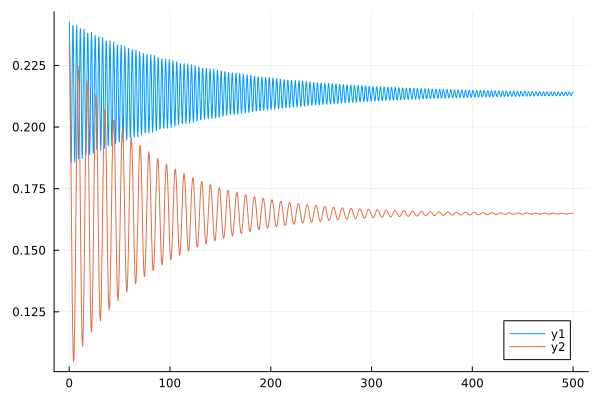

In [12]:
plot(t,real(x1))
plot!(tt,xx1)
    

In [13]:
plotfig='0'

if true
    if plotfig=='a'
        F= jldopen("Results_out_Ufi1.0Vfi0.5.jld2","r")
        i=3
    elseif plotfig=='b'
        F= jldopen("Results_out_V0.5Uin2.0.jld2","r")
        i=10
    elseif plotfig=='c'
        F= jldopen("Results_out_Ufi2.0Vfi1.0.jld2","r")
        i=6
    elseif plotfig=='d'
        F= jldopen("Results_out_Ufi2.0Vfi0.5.jld2","r")
        i=3
    elseif plotfig=='e'
        F= jldopen("Results_out_Ufi1.0Vfi1.0.jld2","r")
        i=6
    elseif plotfig=='f'
        F= jldopen("Results_out_V0.5Uin0.1.jld2","r")
        i=76
    else
        println("Case chosed above. Not a-f")
    end
end


println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Uin=F["$i"]["Uin"]
Vin=F["$i"]["Vin"]
UU=F["$i"]["UU"]
VV=F["$i"]["VV"]
L=1000;

Case chosed above. Not a-f
1.0	0.1	1.0	0.5


### Finding limiting values

In [14]:
count=1
flimit=0
glimit=0
rho1limit=0
rho2limit=0
rho3limit=0
for j in 1:length(F)
    if(F["$j"]["Uin"]==UU && F["$j"]["Vin"]==VV)
        flimit=real(F["$j"]["solution_rho"][3,1] + F["$j"]["solution_rho"][7,1])
        glimit=real(F["$j"]["solution_C"][1,1])
        rho1limit=real(F["$j"]["solution_rho"][1,1])
        rho2limit=real(F["$j"]["solution_rho"][5,1])
        rho3limit=real(F["$j"]["solution_rho"][2,1])
        count+=1
        println("Find!")
        break
    else
        count+=1
    end
end




xmax=508

    if abs(UU-2)<1e-8 && abs(VV-0.5)<1e-8       # (d)
        rho1limit=0.0268396     
        rho2limit=0.47316
        rho3limit=0.112692
        flimit=2*rho3limit
        glimit=-0.126245/VV
        xmax=85;
    elseif abs(UU-1)<1e-8 && abs(VV-1)<1e-8      # (e)
        rho1limit=0.17880627965232862             
        rho2limit=0.32119372034767069
        rho3limit=0.23964860563553764
        flimit=2*rho3limit
        glimit=-0.42076850198/VV
        xmax=205;
    elseif abs(UU-2)<1e-8 && abs(VV-1.0)<1e-8    # (c)
        rho1limit= 0.119909           
        rho2limit=0.380091
        rho3limit=0.213486
        flimit=2*rho3limit
        glimit=-0.410264/VV
        xmax=85;
    elseif abs(UU-1)<1e-8 && abs(VV-0.5)<1e-8     # (a) (b)
        rho1limit=0.0972393          
        rho2limit=0.402761
        rho3limit=0.197899
        flimit=2*rho3limit
        glimit=-0.161936/VV;
        xmax=135
    elseif abs(UU-4)<1e-8 && abs(VV-0.5)<1e-8     # (f)
        rho1limit= 0.0010811680359154845             
        rho2limit=0.4989188319640846
        rho3limit= 0.02322531148630427
        flimit=2*rho3limit
        glimit= -0.09330478201/VV
        xmax=508;
    end
    println("Such starting values does not exist!")




lbfs=20
tkfs=16
lgfs=16

xsize2=800
ysize2=600

xsize3=900
ysize3=900

Such starting values does not exist!


900

In [25]:
i=10
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])

1.0	0.1	1.0	5.0


## Mean-field parameters

NO PDF files will be created!


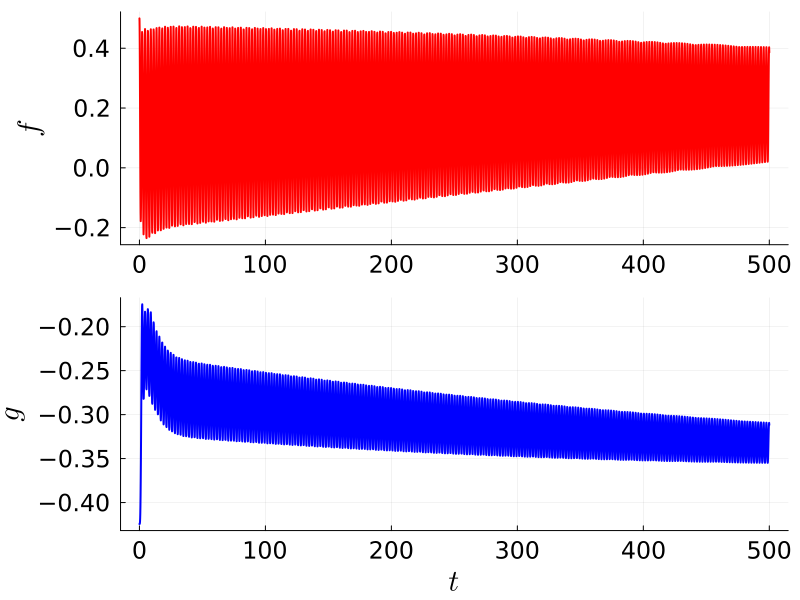

In [26]:
f=F["$i"]["solution_rho"][3,:] + F["$i"]["solution_rho"][7,:]
g=F["$i"]["solution_C"][1,:]
t=F["$i"]["t"]




pfg2=plot(t, real(g),lw=2, linestyle=:solid, linecolor=:blue, markershape=:none, markersize=3,
label=:none, #L"f",
xlabel=L"t",
ylabel=L"g",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:right,
#legend=:topright,
#xlims=(0, xmax)
#xlims=(900, 1000),
#ylims=(-0.325, -0.315),
)
#pfg2=hline!([glimit], lw=0.5, label=nothing,linecolor=:black)

pfg1=plot(t, real(f),lw=2, linestyle=:solid, linecolor=:red, markershape=:none, markersize=3,
label=:none, #L"f",
#xlabel=L"t",
ylabel=L"f",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:right,
#legend=:topright,
#xlims=(0, xmax),
#xlims=(200, 300),
#ylims=(0.225376, 0.225378)
)
#pfg1=hline!([flimit], lw=0.5, label=nothing,linecolor=:black)



pfg=plot(pfg1,pfg2, layout = (2, 1), size =(xsize2,ysize2))

#plot!(ylims=(-1e-5, 1e-5))
#plot!(xrange=[-1e-6,t[4]],yrange=[-1e-12,1e-12])

#plot!(xlims=(0, xmax))

if Print_fg
    savefig("gf_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(pfg)

##  Density matrix

In [22]:
using LinearAlgebra
x1=F["$i"]["solution_rho"][1,:]
x2=F["$i"]["solution_rho"][2,:]
x3=F["$i"]["solution_rho"][3,:]
x4=F["$i"]["solution_rho"][4,:]
x5=F["$i"]["solution_rho"][5,:]
x6=F["$i"]["solution_rho"][6,:]
x7=F["$i"]["solution_rho"][7,:]
x8=F["$i"]["solution_rho"][8,:]
x9=F["$i"]["solution_rho"][9,:]
x10=F["$i"]["solution_rho"][10,:];

NO PDF files will be created!


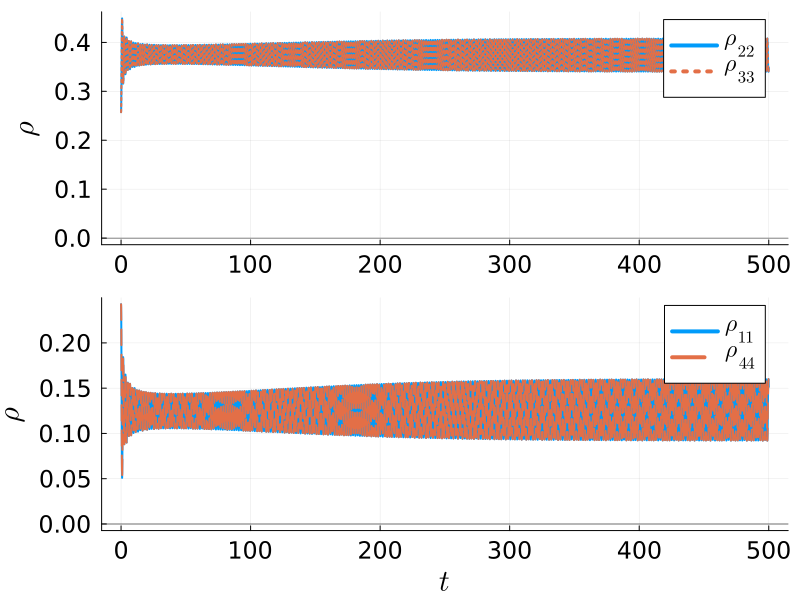

In [24]:
p1=plot(t, real(x1),lw=2,label=L"\rho_{11}",  linestyle=:solid, markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#xlims=(0, xmax)
#xlims=(600, 700),
#ylims=(0.08, 0.1)
)
p1=plot!(t, real(x10),lw=2,label=L"\rho_{44}",linestyle=:dash,   markershape=:none, markersize=3)
p1=hline!([rho1limit], lw=0.5, label=nothing,linecolor=:black)

p2=plot(t, real(x5),lw=2,label=L"\rho_{22}", linestyle=:solid, markershape=:none, markersize=3,
#xlabel=L"t",
ylabel=L"\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#xlims=(0, xmax)
#xlims=(900, 950),
#ylims=(0.4975, 0.50),
#ylims=(0.46, 0.48),
#ylims=(0.42, 0.48),
)


p2=plot!(t, real(x8),lw=2,label=L"\rho_{33}", linestyle=:dot,  markershape=:none, markersize=3)
p2=hline!([rho2limit], lw=0.5, label=nothing,linecolor=:black)

p=plot(p2,p1, layout = (2, 1), size =(xsize2,ysize2))


##plot!(ylims=(-1e-6, 1e-6))

##plot!(xlims=(50, 500), ylims=(-0.0065,.00085))

if Print_rho
    savefig("rho_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(p)


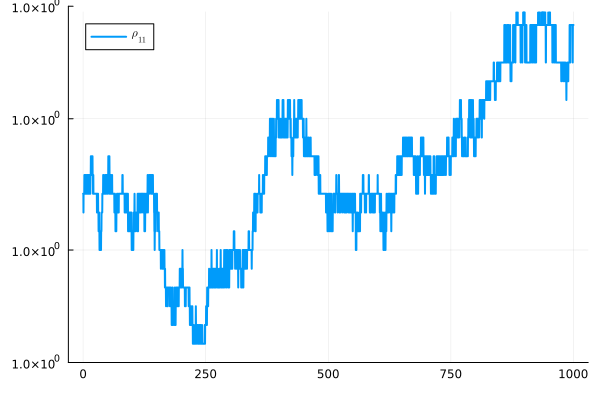

GKS: Possible loss of precision in routine SET_WINDOW


In [16]:
p1=plot(t, real(x1 + x5 + x8 +x10),lw=2,label=L"\rho_{11}")

NO PDF files will be created!


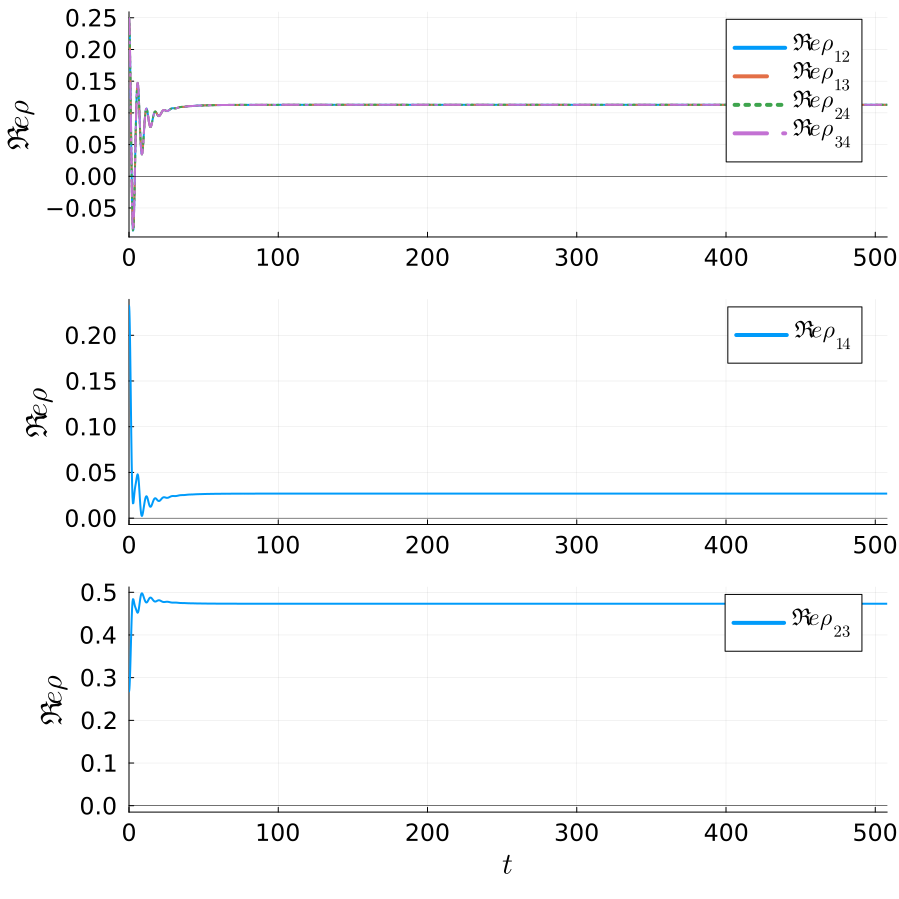

In [17]:
pre1=plot(t, real(x2),lw=2,label=L"\Re e \rho_{12}", linestyle=:solid,  markershape=:none, markersize=3,
#xlabel=L"t",
ylabel=L"\Re e\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#legend=:outertopright,
xlims=(0, xmax)
)
pre1=plot!(t, real(x3),lw=2,label=L"\Re e\rho_{13}", linestyle=:dash,   markershape=:none, markersize=3)
pre1=plot!(t, real(x7),lw=2,label=L"\Re e\rho_{24}", linestyle=:dot,    markershape=:none, markersize=3)
pre1=plot!(t, real(x9),lw=2,label=L"\Re e\rho_{34}", linestyle=:dashdot,markershape=:none, markersize=3)
pre1=hline!([rho3limit], lw=0.5, label=nothing,linecolor=:black)


pre2=plot(t, real(x4),lw=2,label=L"\Re e\rho_{14}", linestyle=:solid,  markershape=:none, markersize=3,
#xlabel=L"t",
ylabel=L"\Re e\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#legend=:outertopright,
xlims=(0, xmax)
)
pre2=hline!([rho1limit], lw=0.5, label=nothing,linecolor=:black)

pre3=plot(t, real(x6),lw=2,label=L"\Re e\rho_{23}", linestyle=:solid,  markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"\Re e\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#legend=:outertopright,
xlims=(0, xmax))
pre3=hline!([rho2limit], lw=0.5, label=nothing,linecolor=:black)






pre=plot(pre1,pre2,pre3,layout = (3, 1), size =(xsize3,ysize3))
    


#plot!(ylims=(-1e-6, 1e-6))
#plot!(xlims=(0, 100))   


if Print_rho_re
    savefig("rho_re_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(pre)

NO PDF files will be created!


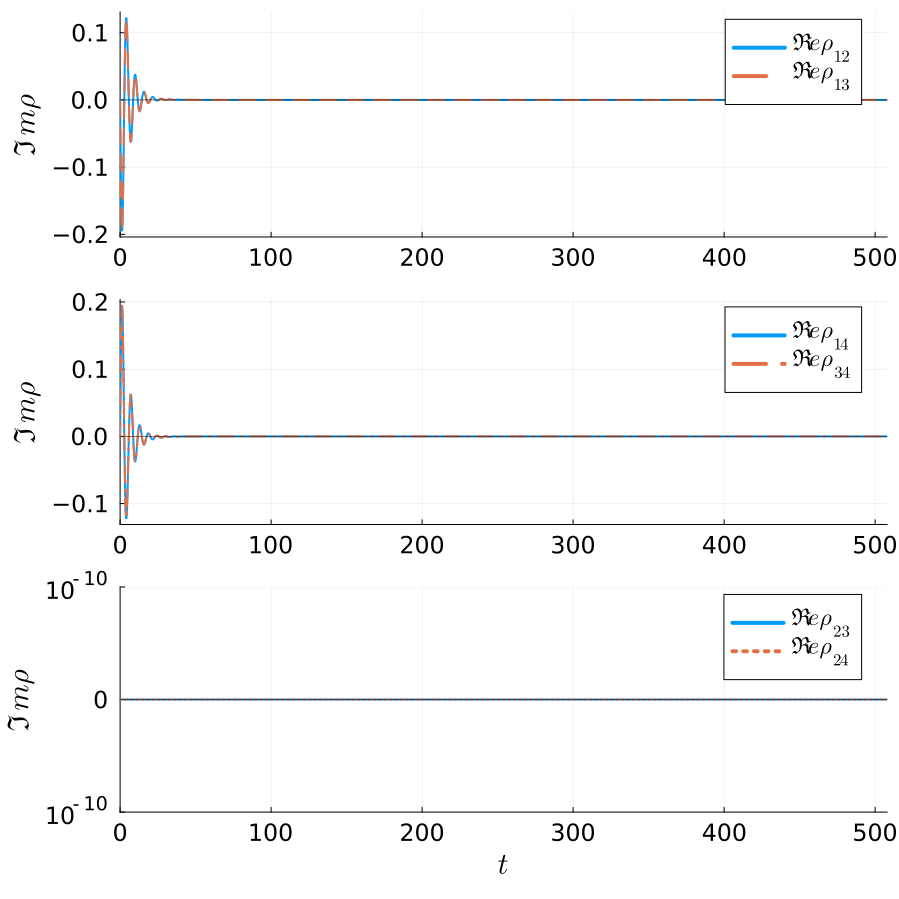

In [18]:
pim1=plot(t, imag(x2),lw=2,label=L"\Re e \rho_{12}", linestyle=:solid,  markershape=:none, markersize=3,
#xlabel=L"t",
ylabel=L"\Im m\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#legend=:outertopright,
xlims=(0, xmax))
pim1=plot!(t, imag(x3),lw=2,label=L"\Re e\rho_{13}", linestyle=:dash,   markershape=:none, markersize=3)

pre1=hline!([0], lw=0.5, label=nothing,linecolor=:black)

pim2=plot(t, imag(x7),lw=2,label=L"\Re e\rho_{14}", linestyle=:solid,  markershape=:none, markersize=3,
#xlabel=L"t",
ylabel=L"\Im m\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#legend=:outertopright,
xlims=(0, xmax))
pim2=plot!(t, imag(x9),lw=2,label=L"\Re e\rho_{34}", linestyle=:dashdot,markershape=:none, markersize=3)

pre2=hline!([0], lw=0.5, label=nothing,linecolor=:black)


pim3=plot(t, imag(x4),lw=2,label=L"\Re e\rho_{23}", linestyle=:solid,  markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"\Im m\rho",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:topright,
#legend=:outertopright,
xlims=(0, xmax),
ylimits=(-1e-10,1e-10),
yticks = ([-1e-10:1e-10:1e-10;], ["10^{-10}", "0", "10^{-10}"])
)
pim3=plot!(t, imag(x6),lw=2,label=L"\Re e\rho_{24}", linestyle=:dot,    markershape=:none, markersize=3)

pre3=hline!([0], lw=0.5, label=nothing,linecolor=:black)

pim=plot(pim1,pim2,pim3,layout = (3, 1), size =(xsize3,ysize3))


#plot!(xlims=(0, 100))   
#, ylims=(-0.005,0.15))

if Print_rho_im
    savefig("rho_im_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(pim)

NO PDF files will be created!


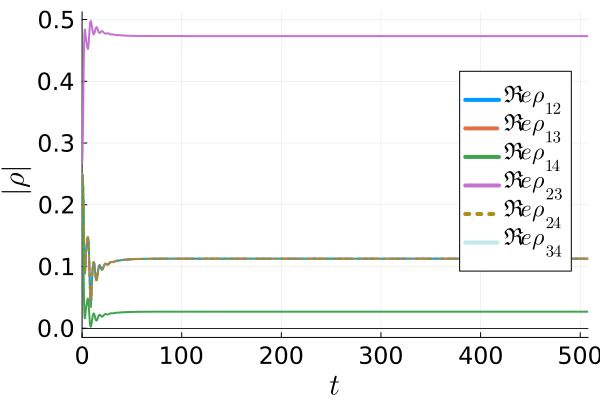

In [19]:
pabs=plot(t, abs.(x2),lw=2,label=L"\Re e \rho_{12}", linestyle=:solid,  markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"|\rho|",
labelfontsize=20,
tickfontsize=16,
legendfontsize=16,
legend=:right,
#legend=:outertopright,
xlims=(0, xmax)
)
pabs=plot!(t, abs.(x3),lw=2,label=L"\Re e\rho_{13}", linestyle=:dash,   markershape=:none, markersize=3)
pabs=plot!(t, abs.(x4),lw=2,label=L"\Re e\rho_{14}", linestyle=:solid,  markershape=:none, markersize=3)
pabs=plot!(t, abs.(x6),lw=2,label=L"\Re e\rho_{23}", linestyle=:solid,  markershape=:none, markersize=3)
pabs=plot!(t, abs.(x7),lw=2,label=L"\Re e\rho_{24}", linestyle=:dot,    markershape=:none, markersize=3)
pabs=plot!(t, abs.(x9),lw=2,label=L"\Re e\rho_{34}", linestyle=:dashdot,markershape=:none, markersize=3, alpha=0.25)


p=hline!([rho1limit], lw=0.5, label=nothing,linecolor=:black)
p=hline!([rho2limit], lw=0.5, label=nothing,linecolor=:black)
p=hline!([rho3limit], lw=0.5, label=nothing,linecolor=:black)


#plot!(xlims=(0, 100))   
#, ylims=(-0.005,0.15))


if Print_rho_abs
    savefig("rho_abs_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(pabs)


NO PDF files will be created!


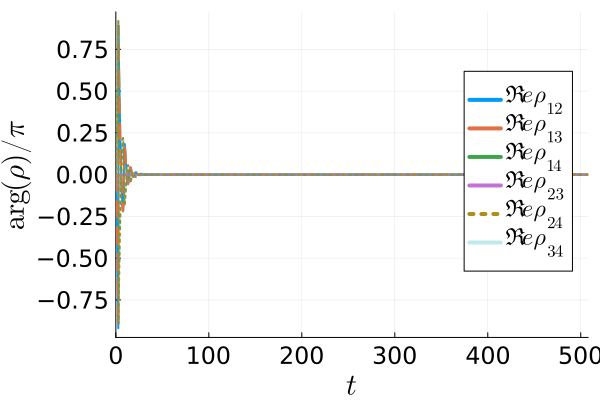

In [20]:
pang=plot(t, angle.(x2)/pi,lw=2,label=L"\Re e \rho_{12}", linestyle=:solid,  markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"\arg(\rho)/\pi",
labelfontsize=20,
tickfontsize=16,
legendfontsize=16,
legend=:right,
#legend=:outertopright,
xlims=(0, xmax))
pang=plot!(t, angle.(x3)/pi,lw=2,label=L"\Re e\rho_{13}", linestyle=:dash,   markershape=:none, markersize=3)
pang=plot!(t, angle.(x4)/pi,lw=2,label=L"\Re e\rho_{14}", linestyle=:solid,  markershape=:none, markersize=3)
pang=plot!(t, angle.(x6)/pi,lw=2,label=L"\Re e\rho_{23}", linestyle=:solid,  markershape=:none, markersize=3)
pang=plot!(t, angle.(x7)/pi,lw=2,label=L"\Re e\rho_{24}", linestyle=:dot,    markershape=:none, markersize=3)
pang=plot!(t, angle.(x9)/pi,lw=2,label=L"\Re e\rho_{34}", linestyle=:dashdot,markershape=:none, markersize=3, alpha=0.25)




#plot!(xlims=(0, 100))   
#, ylims=(-0.005,0.15))

if Print_rho_arg
    savefig("rho_angle_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(pang)

In [21]:
i=37
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
t=F["$i"]["t"];

0.5	0.1	0.5	4.0


##  $C_{i,i+1}$

NO PDF files will be created!


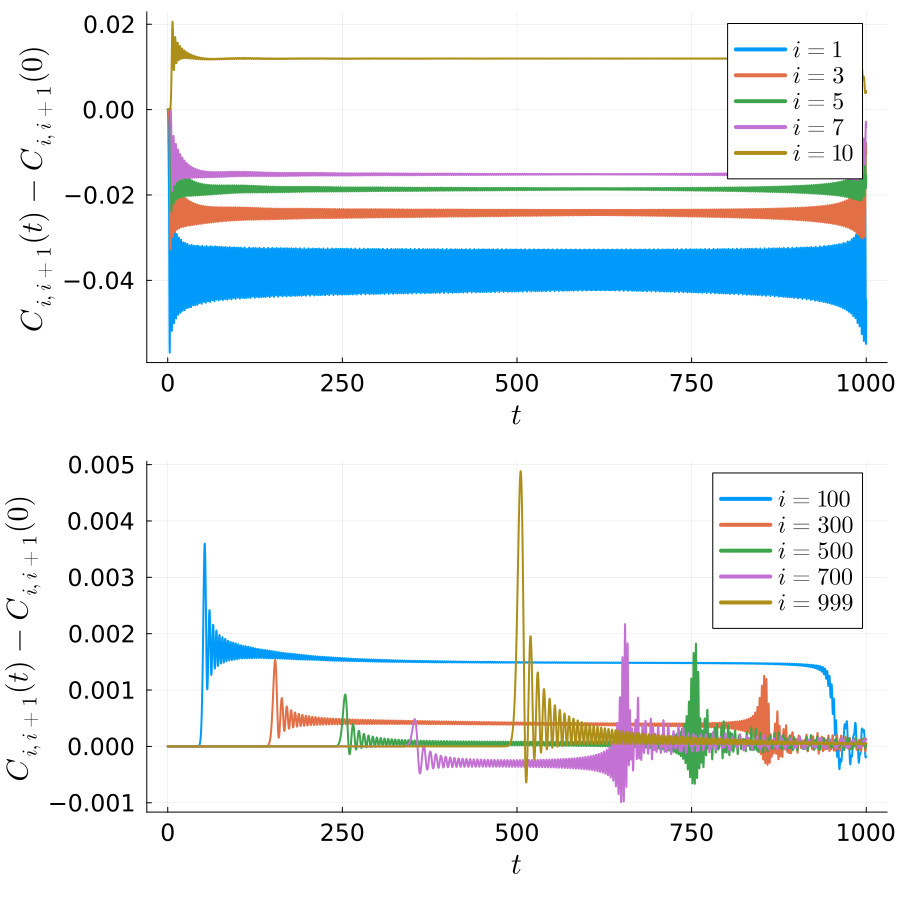

In [22]:
#plot!(xlims=(0, 100))   
#, ylims=(-0.005,0.15))


#isite=1
#Cij=F["$i"]["solution_C"][1+isite,:]
#pcij=plot(t, real(Cij .-Cij[1]),lw=2,label=L"i=1", linestyle=:solid, markershape=:auto, markersize=8)

isite=100
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_1=plot(t, real.(Cij .-Cij[1]),lw=2,label=L"i=100", 
linestyle=:solid, markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"C_{i,i+1}(t) - C_{i,i+1}(0)",
labelfontsize=20,
tickfontsize=16,
legendfontsize=16,
#legend=:none, 
legend=:topright,
)


#isite=100
#Cij=F["$i"]["solution_C"][1+isite,:]
#pcij_1=plot!(t,real.(Cij .-Cij[1]) ,lw=2,label=L"i=100", 
#linestyle=:solid, markershape=:none, markersize=3)


isite=300
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_1=plot!(t,real.(Cij .-Cij[1]) ,lw=2,label=L"i=300", 
linestyle=:solid, markershape=:none, markersize=3)


isite=500
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_1=plot!(t, real.(Cij .-Cij[1]) ,lw=2,label=L"i=500", 
linestyle=:solid, markershape=:none, markersize=3)

isite=700
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_1=plot!(t, real.(Cij .-Cij[1]) ,lw=2,label=L"i=700", 
linestyle=:solid, markershape=:none, markersize=3)

isite=999
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_1=plot!(t, real.(Cij .-Cij[1]) ,lw=2,label=L"i=999", 
linestyle=:solid, markershape=:none, markersize=3)




isite=1
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_2=plot(t, real.(Cij .-Cij[1]),lw=2,label=L"i=1", 
linestyle=:solid, markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"C_{i,i+1}(t) - C_{i,i+1}(0)",
labelfontsize=20,
tickfontsize=16,
legendfontsize=16,
#legend=:none,          #topright
legend=:topright,
)



isite=3
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_2=plot!(t,real.(Cij .-Cij[1]) ,lw=2,label=L"i=3", 
linestyle=:solid, markershape=:none, markersize=3)


isite=5
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_2=plot!(t, real.(Cij .-Cij[1]) ,lw=2,label=L"i=5", 
linestyle=:solid, markershape=:none, markersize=3)

isite=7
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_2=plot!(t, real.(Cij .-Cij[1]) ,lw=2,label=L"i=7", 
linestyle=:solid, markershape=:none, markersize=3)

isite=10
Cij=F["$i"]["solution_C"][1+isite,:]
pcij_2=plot!(t, real.(Cij .-Cij[1]) ,lw=2,label=L"i=10", 
linestyle=:solid, markershape=:none, markersize=3)





pcij=plot(pcij_2,pcij_1, layout = (2, 1), size =(xsize3,ysize3))

#plot!(xrange=[0,1],yrange=[-1e-7,1e-7])

if Print_Cij
    savefig("Cij_sites_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end

display(pcij)


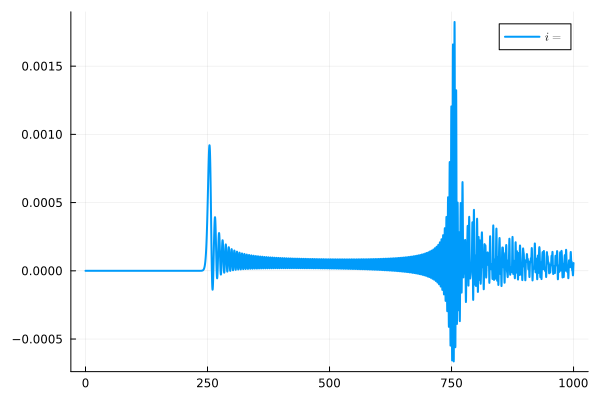

In [23]:
isite=500
Cij=F["$i"]["solution_C"][1+isite,:]
plot(t,real.(Cij .-Cij[1]) ,lw=2,label=L"i=", 
linestyle=:solid, markershape=:none, markersize=3)

In [24]:

#p = contourf(t, site_arr, data, color=:turbo, levels=10)

NO PDF files will be created!


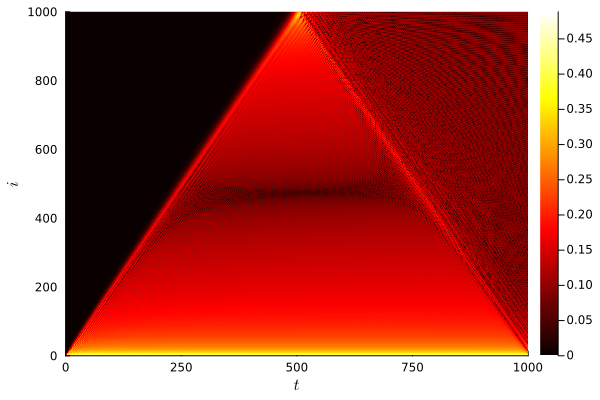

In [25]:
Cijt = deepcopy(F["$i"]["solution_C"])



data     = abs.(Cijt) #abs.((Cijt .- Cij[1]) ./ (Cijt[:,end] .- Cijt[:,1]))
site_arr = collect(0:(size(Cijt, 1) - 1))[2:end]
data = data[2:end,:]

tt = repeat(data[:,1], 1, size(data,2))
    

#tordered=sortslices(data .-tt, dims=1)    


pcolor=heatmap(t, site_arr[1:2:end],  sqrt.(sqrt.(abs.(data .- tt)[1:2:end,:])),c=:hot)


#pcolor = contourf(t, site_arr[1:2:end], sqrt.(sqrt.(abs.(data .- tt)[1:2:end,:])), color=:turbo, levels=300)
 

xlabel!(L"t")
ylabel!(L"i")


if Print_Cij
    savefig("Cij_color_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end


display(pcolor)


In [26]:
#Cijt = deepcopy(F["$i"]["solution_C"])[1,:]
#length(Cijt)

In [27]:
isite=100
Cij=F["$i"]["solution_C"][1+isite,:];

Cij[argmax(real.(Cij))]

Cijt = deepcopy(F["$i"]["solution_C"])
Cijt[argmax(real.(Cijt))]

0.226792006804794 - 2.2821996637101556e-15im

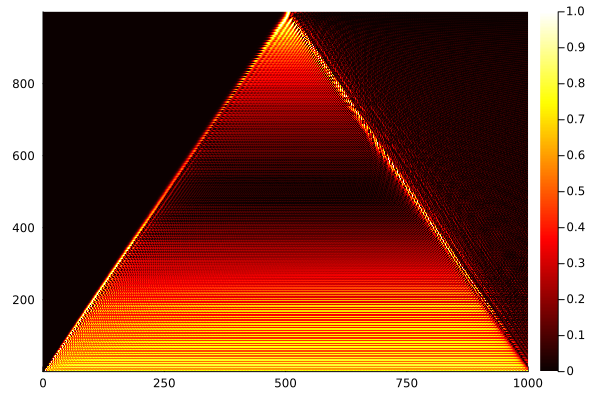

In [28]:
Cijt = deepcopy(F["$i"]["solution_C"])



data     = real.(Cijt) #abs.((Cijt .- Cij[1]) ./ (Cijt[:,end] .- Cijt[:,1]))
site_arr = collect(0:(size(Cijt, 1) - 1))[2:end]
data = data[2:end,:]

tt = repeat(data[:,1], 1, size(data,2))

Deltadata=abs.(data - tt)

MaxDeltadata = Array{Float64}(undef,999);
RelData = similar(Deltadata);

for site in 1:999
    MaxDeltadata[site]=abs.(Deltadata[site,argmax(abs.(Deltadata[site,:]))])
end

    
for site in 1:999
    RelData[site,:] =Deltadata[site,:] ./ MaxDeltadata[site]
end
        
pcolor=heatmap(t, site_arr[1:1:end],  RelData[1:1:end,:],c=:hot)        


0.5	0.1	0.5	0.2
0.5	0.1	0.5	0.5
0.5	0.1	0.5	1.5
0.5	0.1	0.5	2.5
0.5	0.1	0.5	3.0
0.5	0.1	0.5	3.5
0.5	0.1	0.5	3.9
0.5	0.1	0.5	4.0


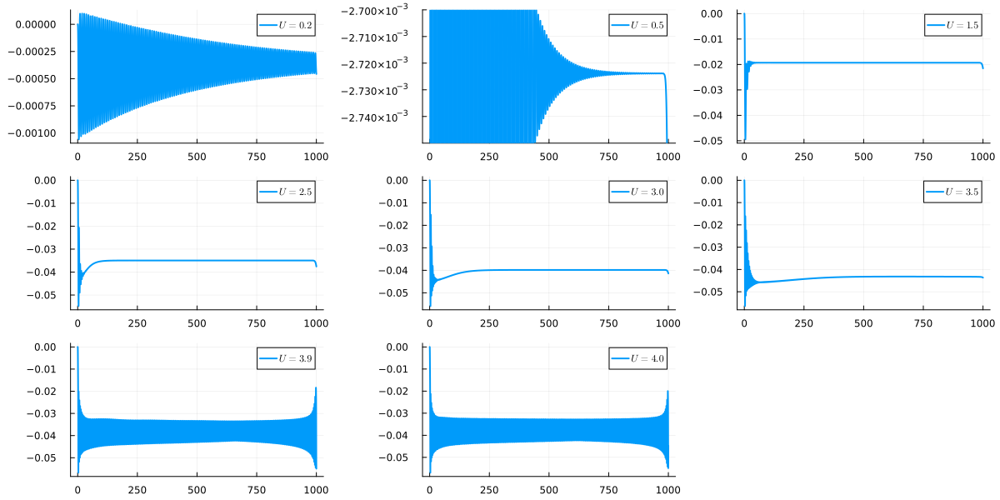

In [29]:
isite=1 

i=2
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p1 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)



i=5
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p2 = plot(t,real.(Cij .-Cij[1]) ,lw=2, ylims=(-0.00275,-0.0027), label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)

i=15
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p3 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)


i=25
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p4 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)

i=30
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p5 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)

i=35
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p6 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)

i=36
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p7 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)


i=37
println(F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
Cij=F["$i"]["solution_C"][1+isite,:]
t=F["$i"]["t"];
Up = F["$i"]["UU"]
p8 = plot(t,real.(Cij .-Cij[1]) ,lw=2, label=L"U=%$Up", linestyle=:solid, markershape=:none, markersize=3)

plot(p1, p2, p3,p4,p5,p6,p7,p8, size=(1200,600))

## Energy

In [30]:
E_imp=-0.5*UU*(x5 .+ x8)  .+ 2*VV*g.*(x2+x3+x7+x9);

E_ch=0 *E_imp
for isite in 1:L-1 
    E_ch .+= 2*F["$i"]["solution_C"][1+isite,:]
end
E_ch .+=2*f.*g*VV;

E_c=-2*f.*g*VV;

E_tot=E_imp+2*(E_ch+E_c);


E_imp_delta=E_imp .-E_imp[1]
E_ch_delta=E_ch .-E_ch[1]
E_c_delta=E_c .-E_c[1]

E_tot_delta=E_tot .-E_tot[1]


p_en=plot(t, real(E_imp_delta),lw=2,label=L"\Delta E_{imp}",linestyle=:solid, markershape=:none, markersize=3,
xlabel=L"t",
ylabel=L"E",
labelfontsize=20,
tickfontsize=16,
legendfontsize=16,
legend=:right,
#legend=:outertopright,
xlims=(0, xmax)
)
p_en=plot!(t, real(E_ch_delta),lw=2,label=L"\Delta E_{ch}",linestyle=:solid, markershape=:none, markersize=3)
p_en=plot!(t, real(E_c_delta),lw=2,label=L"{\Delta {\cal C}}",linestyle=:solid, markershape=:none, markersize=3)
p_en=plot!(t, real(E_tot_delta),lw=2,label=L"\Delta E_{tot}",linestyle=:solid, markershape=:none)

#plot!(xlims=(0, 100), ylims=(-0.02,0.02))

if Print_energy
    savefig("Energy_U($Uin)V($Vin)-U($UU)V($VV).pdf")
else
    println("NO PDF files will be created!")
end
    
display(p_en)



LoadError: DimensionMismatch: array could not be broadcast to match destination

In [31]:
plot(t, real(E_tot_delta),lw=2,label=L"\Delta E_{tot}",linestyle=:solid, markershape=:none)

LoadError: UndefVarError: `E_tot_delta` not defined

In [32]:
plot(t, abs.(E_imp),lw=2,label=L"\Delta E_{imp}",linestyle=:solid, markershape=:none)

plot!(t, abs.(E_c),lw=2,label=L"\Delta E_{C}",linestyle=:solid, markershape=:none)

plot!(t, abs.(E_ch./L),lw=2,label=L"\Delta E_{ch}",linestyle=:solid, markershape=:none)

LoadError: UndefVarError: `E_c` not defined

# Plotting Equilibrium

In [33]:
using DelimitedFiles
arr = open("/home/localadmin/Nextcloud/TeX/SIAM_MF_decoupling/Results/L1000/Main_Results_Full.dat","r") do f
    readdlm(f)
end;

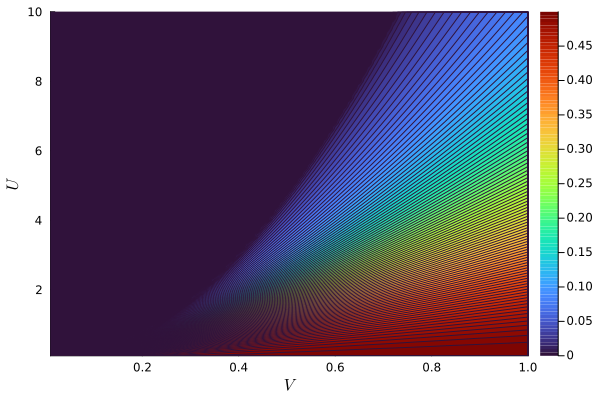

In [34]:
using Plots
using LaTeXStrings
xarr = unique(arr[:,2])
yarr = unique(arr[:,1])
zarr= arr[:,4] ./ arr[:,2]
p = contourf(xarr, yarr, zarr, color=:turbo, levels=100)
xlabel!(L"V")
ylabel!(L"U")
savefig("PD.pdf")
display(p)

In [35]:
FFF= jldopen("Q_Uin0.1Vin0.5Ufi0.5Vfi0.5.jld2","r")

JLDFile /home/localadmin/Nextcloud/TeX/SIAM_MF_decoupling/Results/Time_evolution_Julia/Q_Uin0.1Vin0.5Ufi0.5Vfi0.5.jld2 (read-only)
 ├─🔢 solution
 ├─🔢 t
 ├─🔢 Uin
 ├─🔢 Vin
 ├─🔢 UU
 ├─🔢 VV
 └─🔢 L

In [36]:
Ftrue= jldopen("Q_Uin0.1Vin0.5Ufi0.5Vfi0.5_true.jld2","r")

JLDFile /home/localadmin/Nextcloud/TeX/SIAM_MF_decoupling/Results/Time_evolution_Julia/Q_Uin0.1Vin0.5Ufi0.5Vfi0.5_true.jld2 (read-only)
 ├─🔢 solution
 ├─🔢 t
 ├─🔢 Uin
 ├─🔢 Vin
 ├─🔢 UU
 ├─🔢 VV
 └─🔢 L

In [37]:
FF1= jldopen("Results_out_V0.5Uin2.0.jld2","r")
FF2= jldopen("Results_out_V0.5Uin0.1.jld2","r")

JLDFile /home/localadmin/Nextcloud/TeX/SIAM_MF_decoupling/Results/Time_evolution_Julia/Results_out_V0.5Uin0.1.jld2 (read-only)
 ├─📂 1
 │  ├─🔢 solution_rho
 │  ├─🔢 solution_C
 │  ├─🔢 t
 │  ├─🔢 Uin
 │  ├─🔢 Vin
 │  ├─🔢 UU
 │  └─🔢 VV
 ├─📂 2 (7 entries)
 └─ ⋯ (75 more entries)

In [38]:
#for i in 1:length(F)
#    println(i,"\t\t",F["$i"]["Vin"],"\t",F["$i"]["Uin"],"\t",F["$i"]["VV"],"\t",F["$i"]["UU"])
#end
#for i in 1:length(FF)
#    println(i,"\t\t",FF["$i"]["Vin"],"\t",FF["$i"]["Uin"],"\t",FF["$i"]["VV"],"\t",FF["$i"]["UU"])
#end

ii1=10
println(ii1,"\t\t",FF1["$ii1"]["Vin"],"\t",FF1["$ii1"]["Uin"],"\t",FF1["$ii1"]["VV"],"\t",FF1["$ii1"]["UU"])


ii2=76
println(ii2,"\t\t",FF2["$ii2"]["Vin"],"\t",FF2["$ii2"]["Uin"],"\t",FF2["$ii2"]["VV"],"\t",FF2["$ii2"]["UU"])

10		0.5	2.0	0.5	1.0
76		0.5	0.1	0.5	4.0


NO PDF files will be created!


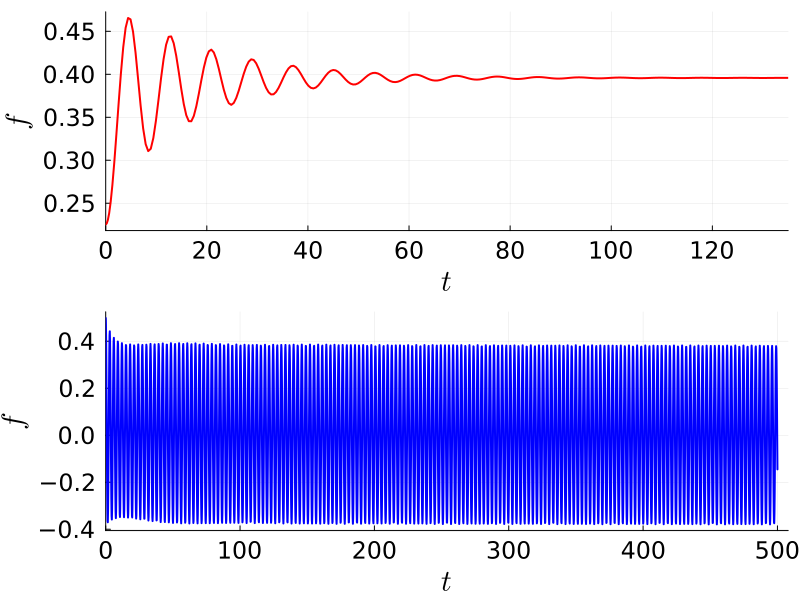

In [39]:
ff1=FF1["$ii1"]["solution_rho"][3,:] + FF1["$ii1"]["solution_rho"][7,:]
tt1=FF1["$ii1"]["t"]
ff2=FF2["$ii2"]["solution_rho"][3,:] + FF2["$ii2"]["solution_rho"][7,:]
tt2=FF2["$ii2"]["t"]


#xmax=205
xmax=135
#xmax=85
xmax2=508
#xmax=500

lbfs=20
tkfs=16
lgfs=16

xsize2=800
ysize2=600

xsize3=900
ysize3=900;


pfg2=plot(tt2, real(ff2),lw=2, linestyle=:solid, linecolor=:blue, markershape=:none, markersize=3,
label=:none, #L"f",
xlabel=L"t",
ylabel=L"f",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:right,
#legend=:topright,
xlims=(0, xmax2)
)
#pfg2=hline!([glimit], lw=0.5, label=nothing,linecolor=:black)

pfg1=plot(tt1, real(ff1),lw=2, linestyle=:solid, linecolor=:red, markershape=:none, markersize=3,
label=:none, #L"f",
xlabel=L"t",
ylabel=L"f",
labelfontsize=lbfs,
tickfontsize=tkfs,
legendfontsize=lgfs,
legend=:right,
#legend=:topright,
xlims=(0, xmax)
)
#pfg1=hline!([flimit], lw=0.5, label=nothing,linecolor=:black)



pfg=plot(pfg1,pfg2, layout = (2, 1), size =(xsize2,ysize2))

#plot!(ylims=(-1e-5, 1e-5))
#plot!(xrange=[-1e-6,t[4]],yrange=[-1e-12,1e-12])

#plot!(xlims=(0, xmax))

Print_fff=false  #true
if Print_fff
    savefig("time_evolution_f.pdf")
else
    println("NO PDF files will be created!")
end

display(pfg)

In [40]:
L=10
LC = (L+3)*L/2
LK = (L-1)*L/2
LIm= 10 + LC +LK

println(LC," ",LK,"  ",LIm)

65.0 45.0  120.0
